In [88]:
import os
import requests
import pickle
import torch
import torchaudio


def clean_url(raw_url):
    return raw_url.replace('/', '?s?')


def unclean_url(clean_url):
    return clean_url.replace('?s?', '/')


def get_transcript(transcript_fp): 
    with open(transcript_fp, 'rb') as f:
        return pickle.load(f)


def get_audio_url(urls, codec='mp3'):
    for url in urls:
        if codec in url:
            return url


def get_audio(url, dirpath):
    fp = os.path.join(dirpath, url)
    if url in os.listdir(dirpath):
        waveform, sample_rate = torchaudio.load(fp)
        return (waveform, sample_rate)

    else:
        with requests.Session() as session:
            audio_bytes = session.get(
                unclean_url(clean_url=url)
            ).content

        with open(fp, 'wb') as f:
            f.write(audio_bytes)

        waveform, sample_rate = torchaudio.load(fp)
        return (waveform, sample_rate)


def get_databunch(transcript_fp, audio_dirpath):
    transcript = get_transcript(transcript_fp=transcript_fp)
    audio_url = get_audio_url(urls=transcript['files'])
    waveform, sample_rate = get_audio(
        url=clean_url(audio_url), 
        dirpath=audio_dirpath
    )
    return (audio_url, transcript, waveform, sample_rate)


def slice_waveform(waveform, start_sec, close_sec, sample_rate):
    s = round(start_sec*sample_rate)
    c = round(close_sec*sample_rate)
    return waveform[:, s:c]


def play(waveform, sample_rate):
    IPython.display.Audio(waveform.numpy(), rate=sample_rate)

In [54]:
from scrape_oyez import AudioTimestamp

In [55]:
transcript_dirpath = 'transcripts'
audio_dirpath = 'full_audios'
ls = os.listdir(transcript_dirpath)
os.path.join(transcript_dirpath, ls[0])

'transcripts/14191_tranny.pickle'

In [56]:
audio_url, transcript, waveform, sample_rate = get_databunch(
    transcript_fp=os.path.join(transcript_dirpath, ls[0]),
    audio_dirpath=audio_dirpath
)

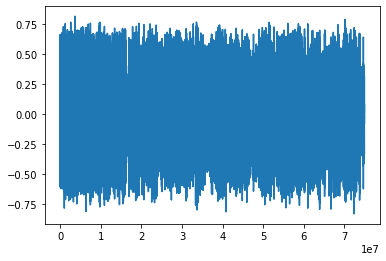

In [30]:
import matplotlib.pyplot as plt

plt.figure()
plt.plot(waveform.t().numpy())

In [31]:
import IPython

audios = [fp for fp in os.listdir(audio_dirpath) if fp[0] != '.']
IPython.display.Audio(os.path.join(audio_dirpath, audios[0]), 
                      rate=sample_rate)

In [70]:
slc = slice_waveform(
        waveform=waveform,
        start_sec=0, 
        close_sec=10,
        sample_rate=sample_rate
)

In [77]:
IPython.display.Audio(slc, rate=sample_rate)

In [93]:
def get_audio_from_transcript_section(
    transcript_section, waveform, sample_rate):
    
    return slice_waveform(
        waveform=waveform,
        start_sec=float(transcript_section['start_time']),
        close_sec=float(transcript_section['stop_time']),
        sample_rate=sample_rate
    )
    
    

In [95]:
idx = 1
k1 = list(transcript['transcript'].keys())[idx]
t1 = transcript['transcript'][k1]
audio_section = get_audio_from_transcript_section(
    transcript_section=t1,
    waveform=waveform,
    sample_rate=sample_rate
)
print(t1['transcript'])
IPython.display.Audio(audio_section, rate=sample_rate)

 The orders -- the other orders of the court are cert -- have been certified by the Chief Justice and filed with the clerk and will not be orally announced. 
